# Notebook for visualizing attention layers during inference

In [5]:
from typing import Union, Tuple, List, Callable, Dict, Optional
from IPython.display import display
from tqdm import tqdm
import sys

# Detect local paths
local_path = !pwd
local_path = local_path[0][:-5]
sys.path.append(local_path + 'src/')

from PIL import Image
from omegaconf import OmegaConf
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, LMSDiscreteScheduler
from src.layout_guidance.my_model import unet_2d_condition



from utils import compute_ca_loss, Pharse2idx, draw_box, setup_logger
from hydra import compose, initialize

import os
import abc
import csv
import torch
import json
import numpy as np
import pandas as pd
import seaborn  as sns 
import matplotlib.pyplot as plt
import imageio


ModuleNotFoundError: No module named 'diffusers.modeling_utils'

### Code for running inference

In [2]:
def inference(device, unet, vae, tokenizer, text_encoder, prompt, bboxes, phrases, cfg, logger):
    with open('attentionmap.csv', 'a') as file:
        column_id = ['TimeStep','AttentionUp', 'AttentionMid', 'AttentionDown']
        writer = csv.writer(file)
        writer.writerow(column_id)
        file.close()
    
    logger.info("Inference")
    logger.info(f"Prompt: {prompt}")
    logger.info(f"Phrases: {phrases}")

    # Get Object Positions
    logger.info("Conver Phrases to Object Positions")
    object_positions = Pharse2idx(prompt, phrases)

    # Encode Classifier Embeddings
    uncond_input = tokenizer(
        [""] * cfg.inference.batch_size, padding="max_length", max_length=tokenizer.model_max_length, return_tensors="pt"
    )
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

    # Encode Prompt
    input_ids = tokenizer(
            [prompt] * cfg.inference.batch_size,
            padding="max_length",
            truncation=True,
            max_length=tokenizer.model_max_length,
            return_tensors="pt",
        )

    cond_embeddings = text_encoder(input_ids.input_ids.to(device))[0]
    text_embeddings = torch.cat([uncond_embeddings, cond_embeddings])
    generator = torch.manual_seed(cfg.inference.rand_seed)  # Seed generator to create the inital latent noise

    latents = torch.randn(
        (cfg.inference.batch_size, 4, 64, 64),
        generator=generator,
    ).to(device)

    noise_scheduler = LMSDiscreteScheduler(beta_start=cfg.noise_schedule.beta_start, beta_end=cfg.noise_schedule.beta_end,
                                           beta_schedule=cfg.noise_schedule.beta_schedule, num_train_timesteps=cfg.noise_schedule.num_train_timesteps)

    noise_scheduler.set_timesteps(cfg.inference.timesteps)

    latents = latents * noise_scheduler.init_noise_sigma

    loss = torch.tensor(10000)

    for index, t in enumerate(tqdm(noise_scheduler.timesteps)):
        iteration = 0

        # up, mid, down = [],[],[]
        while loss.item() / cfg.inference.loss_scale > cfg.inference.loss_threshold and iteration < cfg.inference.max_iter and index < cfg.inference.max_index_step:
            latents = latents.requires_grad_(True)
            latent_model_input = latents
            latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t)
            noise_pred, attn_map_integrated_up, attn_map_integrated_mid, attn_map_integrated_down = \
                unet(latent_model_input, t, encoder_hidden_states=cond_embeddings)
           
            # update latents with guidance
            loss = compute_ca_loss(attn_map_integrated_mid, attn_map_integrated_up, bboxes=bboxes,
                                   object_positions=object_positions) * cfg.inference.loss_scale
            # up.append(attn_map_integrated_up)
            # mid.append(attn_map_integrated_mid)
            # down.append(attn_map_integrated_down)

            grad_cond = torch.autograd.grad(loss.requires_grad_(True), [latents])[0]

            latents = latents - grad_cond * noise_scheduler.sigmas[index] ** 2
            iteration += 1
            torch.cuda.empty_cache()

        with torch.no_grad():
            latent_model_input = torch.cat([latents] * 2)

            latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t)
            noise_pred, attn_map_integrated_up, attn_map_integrated_mid, attn_map_integrated_down = \
                unet(latent_model_input, t, encoder_hidden_states=text_embeddings)
            
            # up.append(attn_map_integrated_up)
            # mid.append(attn_map_integrated_mid)
            # down.append(attn_map_integrated_down)

            attn_dict = {"up":attn_map_integrated_up, "mid":attn_map_integrated_mid, "down":attn_map_integrated_down}
            torch.save(attn_dict, "./pickle/attn_timestep_{}.pt".format(index))
            
            noise_pred = noise_pred.sample

            # perform guidance
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + cfg.inference.classifier_free_guidance * (noise_pred_text - noise_pred_uncond)

            latents = noise_scheduler.step(noise_pred, t, latents).prev_sample
            torch.cuda.empty_cache()

    with torch.no_grad():
        logger.info("Decode Image...")
        latents = 1 / 0.18215 * latents
        image = vae.decode(latents).sample
        image = (image / 2 + 0.5).clamp(0, 1)
        image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
        images = (image * 255).round().astype("uint8")
        pil_images = [Image.fromarray(image) for image in images]
        return pil_images

### Helper function to store and display attention layers

In [3]:
def average_attention(cfg, attention):
    avg_attention = [item / timestep for item in attention for timestep in range(cfg.inference.timesteps)]
    return avg_attention

def aggregate_attention(attention, res, select):
    out = []
    num_pixels = res ** 2
    for item in attention:
        if item.shape[1] == num_pixels:
            cross_maps = item.reshape(len(examples["prompt"]), -1, res, res, item.shape[-1])[select]

def view_images(images, num_rows=1, offset_ratio=0.02):
    if type(images) is list:
        num_empty = len(images) % num_rows
    elif images.ndim == 4:
        num_empty = images.shape[0] % num_rows
    else:
        images = [images]
        num_empty = 0

    empty_images = np.ones(images[0].shape, dtype=np.uint8) * 255
    images = [image.astype(np.uint8) for image in images] + [empty_images] * num_empty
    num_items = len(images)

    h, w, c = images[0].shape
    offset = int(h * offset_ratio)
    num_cols = num_items // num_rows
    image_ = np.ones((h * num_rows + offset * (num_rows - 1),
                      w * num_cols + offset * (num_cols - 1), 3), dtype=np.uint8) * 255
    for i in range(num_rows):
        for j in range(num_cols):
            image_[i * (h + offset): i * (h + offset) + h:, j * (w + offset): j * (w + offset) + w] = images[
                i * num_cols + j]

    pil_img = Image.fromarray(image_)
    display(pil_img)

### Prepare Model

In [4]:
# # Compose configuration file
# initialize(config_path="conf")
# cfg = compose(config_name="base_config")
# #
# # Build model
# with open(cfg.general.unet_config) as f:
#     unet_config = json.load(f)
# unet = unet_2d_condition.UNet2DConditionModel(**unet_config).from_pretrained(cfg.general.model_path, subfolder="unet")
# tokenizer = CLIPTokenizer.from_pretrained(cfg.general.model_path, subfolder="tokenizer")
# text_encoder = CLIPTextModel.from_pretrained(cfg.general.model_path, subfolder="text_encoder")
# vae = AutoencoderKL.from_pretrained(cfg.general.model_path, subfolder="vae")

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# unet.to(device)
# text_encoder.to(device)
# vae.to(device)

# # Prepare the save path
# if not os.path.exists(cfg.general.save_path):
#     os.makedirs(cfg.general.save_path)
# logger = setup_logger(cfg.general.save_path, __name__)

# logger.info(cfg)
# # Save cfg
# logger.info("save config to {}".format(os.path.join(cfg.general.save_path, 'config.yaml')))
# OmegaConf.save(cfg, os.path.join(cfg.general.save_path, 'config.yaml'))



In [5]:
# # Prompt
# examples = {"prompt": "A hello kitty toy is playing with a purple ball.",
#             "phrases": "hello kitty; ball",
#             "bboxes": [[[0.1, 0.2, 0.5, 0.8]], [[0.75, 0.6, 0.95, 0.8]]],
#             'save_path': cfg.general.save_path
#             }

# # Inference
# pil_images = inference(device, unet, vae, tokenizer, text_encoder, examples['prompt'], examples['bboxes'], examples['phrases'], cfg, logger)

# view_images(np.stack(pil_images, axis=0))


In [6]:
# # Save example images
# for index, pil_image in enumerate(pil_images):
#     image_path = os.path.join(cfg.general.save_path, 'example_{}.png'.format(index))
#     logger.info('save example image to {}'.format(image_path))
#     draw_box(pil_image, examples['bboxes'], examples['phrases'], image_path)

In [7]:
t0 = torch.load('./pickle/attn_timestep_0.pt')

In [8]:
print("Up: {} x {} x {}".format(len(t0['up']),len(t0['up'][0][0]), len(t0['up'][0][0][0])))
print("Mid: {} x {} x {}".format(len(t0['mid']),len(t0['mid'][0][0]), len(t0['mid'][0][0][0])))
print("Down: {} x {} x {}".format(len(t0['down']),len(t0['down'][0][0]), len(t0['down'][0][0][0])))

Up: 3 x 16 x 256
Mid: 1 x 64 x 77
Down: 3 x 16 x 4096


In [9]:
# # # Compose configuration file
# initialize(config_path="conf")
# cfg = compose(config_name="base_config")

In [10]:
t = torch.load('./pickle/attn_timestep_' + str(0) + '.pt')
map_obj = t['up'][1][0]

In [11]:
map_obj.shape

torch.Size([16, 1024, 77])

In [12]:
def visualize_attn_maps(block, cfg, attn_block=0, block_num=0):
    for token in range(12):
        filenames = []
        for i in range(cfg.inference.timesteps):
            t = torch.load('./pickle/attn_timestep_' + str(i) + '.pt')
            if block == 'mid':
                map_obj = t['mid'][0]
                block_name = block
            if block == 'up':
                map_obj = t['up'][attn_block][block_num]
                block_name = block + str(attn_block) + '_' +str(block_num)
            b, hw, _ = map_obj.shape
            h = w = int(np.sqrt(hw))
            map = map_obj[:,:,token].reshape(b,h,w)
            avg_map = torch.mean(map, dim=0)
            mean_x_np = avg_map.cpu().numpy()
            plt.figure()
            plt.title('Timestep ' + str(i))
            sns.heatmap(mean_x_np, cmap='rocket_r', vmin=0, vmax=0.07);
            os.makedirs('./attention_vis/' + block_name + '_attn_maps', exist_ok=True)
            plt.savefig('./attention_vis/' + block_name + '_attn_maps/' + '_attn_token_' + str(token) + '_timestep_' + str(i) + '.png')
            filenames.append('./attention_vis/' + block_name + '_attn_maps/' + '_attn_token_' + str(token) + '_timestep_' + str(i) + '.png')
            plt.clf()

        images = []
        for filename in filenames:
            images.append(imageio.imread(filename))
        os.makedirs('./attention_vis/' + block_name + '_gifs', exist_ok=True)
        imageio.mimsave('./attention_vis/' + block_name + '_gifs/gif_token_' + str(token) + '.gif', images)


In [13]:
# Visualize attention maps and create timestep animation
# Mid Block
# mid = visualize_attn_maps('mid', cfg)

# up block 1
# up1_0 = visualize_attn_maps('up', cfg, 1, 0)
# up1_1 = visualize_attn_maps('up', cfg, 1, 1)
# up1_2 = visualize_attn_maps('up', cfg, 1, 2)

In [14]:
# up0_0 = visualize_attn_maps('up', cfg, 0, 0)

In [15]:
# up0_1 = visualize_attn_maps('up', cfg, 0, 1)
# up0_2 = visualize_attn_maps('up', cfg, 0, 2)

In [16]:
# up2_0 = visualize_attn_maps('up', cfg, 2, 0)
# up2_1 = visualize_attn_maps('up', cfg, 2, 1)
# up2_2 = visualize_attn_maps('up', cfg, 2, 2)

In [17]:
# # Load the three GIFs
# gif1 = Image.open('./attention_vis/up0_0_gifs/gif_token_3.gif')
# gif2 = Image.open('./attention_vis/up0_1_gifs/gif_token_3.gif')
# gif3 = Image.open('./attention_vis/up0_2_gifs/gif_token_3.gif')

# # Create a figure with subplots
# fig, axs = plt.subplots(1, 3, figsize=(10, 4))

# # Display the first GIF
# axs[0].imshow(gif1)
# axs[0].axis('off')

# # Display the second GIF
# axs[1].imshow(gif2)
# axs[1].axis('off')

# # Display the third GIF
# axs[2].imshow(gif3)
# axs[2].axis('off')

# # Adjust the layout and display the figure
# plt.tight_layout()
# plt.show()


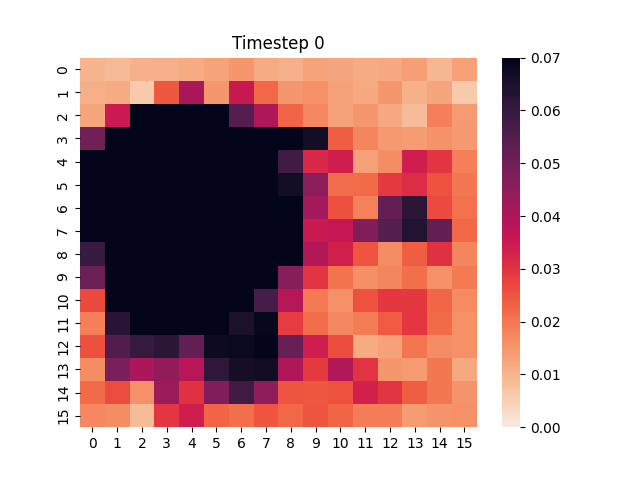

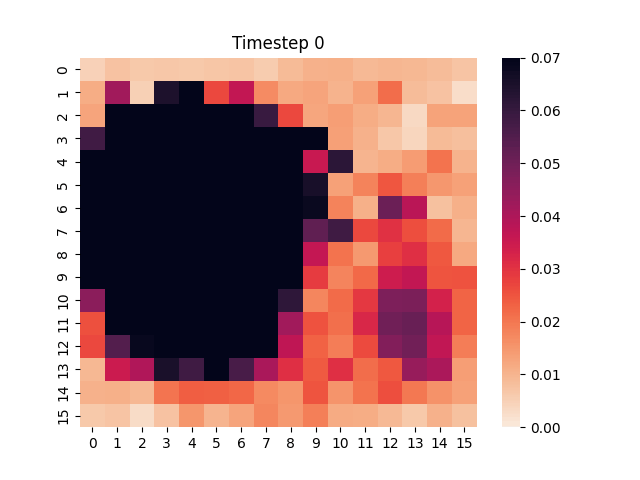

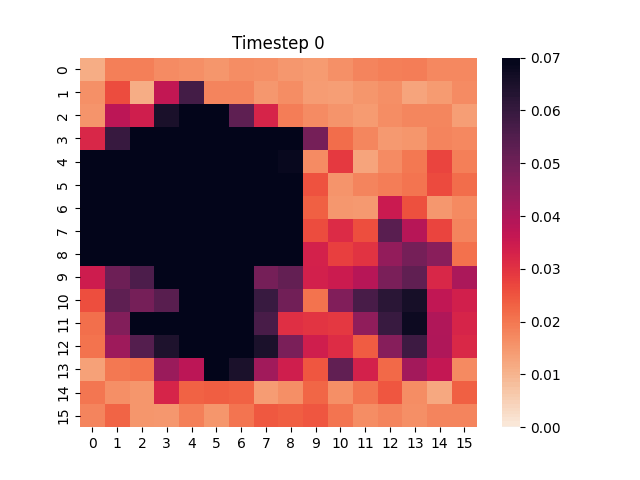

In [18]:
from IPython.display import Image, display

# Function to display GIFs
def display_gif(filename):
    display(Image(filename=filename, format='png'))

# Display the three GIFs
display_gif('./attention_vis/up0_0_gifs/gif_token_3.gif')
display_gif('./attention_vis/up0_1_gifs/gif_token_3.gif')
display_gif('./attention_vis/up0_2_gifs/gif_token_3.gif')


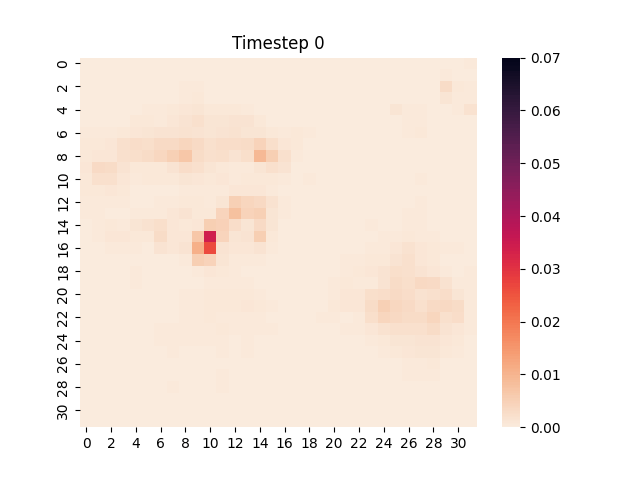

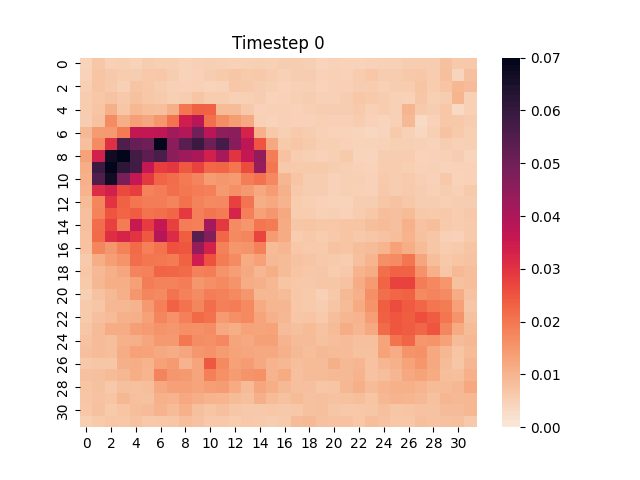

In [20]:
display_gif('./attention_vis/up1_0_gifs/gif_token_3.gif')
# display_gif('./attention_vis/up1_1_gifs/gif_token_3.gif')
display_gif('./attention_vis/up1_2_gifs/gif_token_3.gif')

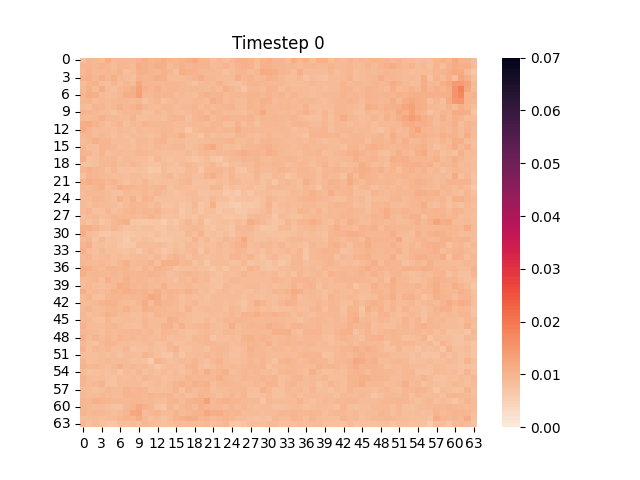

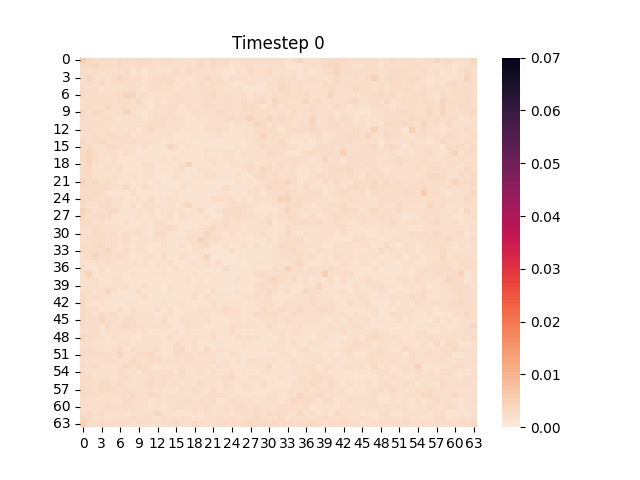

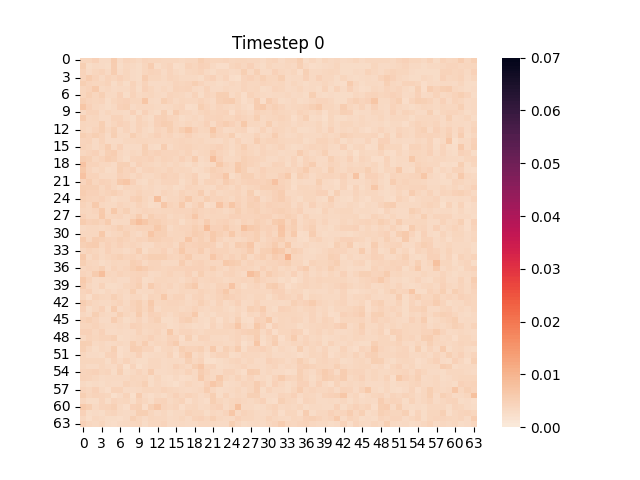

: 

In [21]:
display_gif('./attention_vis/up2_0_gifs/gif_token_3.gif')
display_gif('./attention_vis/up2_1_gifs/gif_token_3.gif')
display_gif('./attention_vis/up2_2_gifs/gif_token_3.gif')